# Endometriosis - Clustering
# PV Cells - all datasets

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '/nfs/team292/lg18/endometriosis/analysis_results/nuclei_only/PV/'
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

'/home/jovyan/my-conda-envs/sc_analysis/bin/python'

In [2]:
def cluster_small_multiples(adata, clust_key, size=10, frameon=False, legend_loc=None, **kwargs):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=adata.obs[clust_key].cat.categories.tolist(),
#         size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

## Load data

In [3]:
path2datas = '/nfs/team292/lg18/endometriosis/integrated_objects/'
adata = sc.read(path2datas+'nuclei_PV_integrated.h5ad')
adata.X.shape

(2217, 33578)

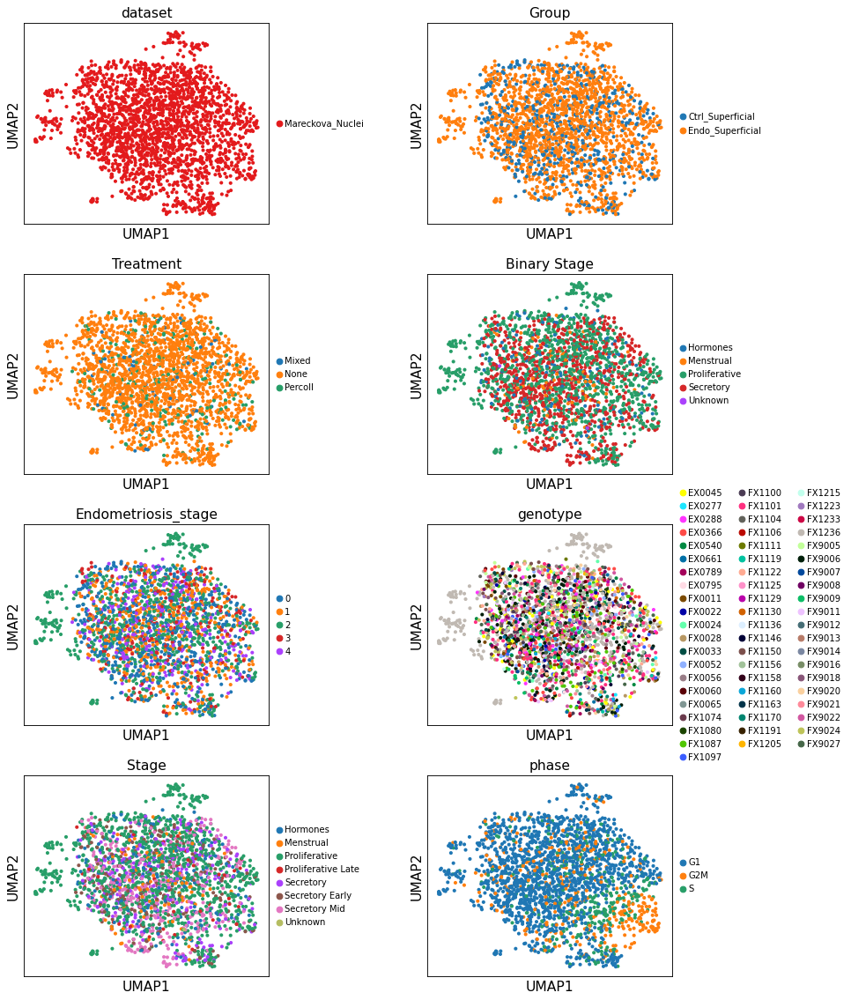

In [4]:
sc.pl.umap(adata, color=['dataset', 'Group', 'Treatment', 'Binary Stage', 'Endometriosis_stage', 'genotype',
                        'Stage', 'phase'], wspace=0.5, legend_fontsize=9, ncols=2, save='_metadata.pdf')

In [5]:
annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/labelTransfer_cell2nuc/mesenchymal/transferred_labels.csv',index_col=0)
annot_df.head()
annot_df.at[annot_df['classifier'] == 'HOXA13', 'classifier'] = 'endocervix_HOXA13'
annot_mesen = annot_df['classifier'].to_dict()

adata.obs['LT_mesen_celltype'] = adata.obs_names.map(annot_mesen)
print(adata.obs['LT_mesen_celltype'].value_counts())

ePV_MMP11             1470
ePV_AOC3               458
Fibroblast_basalis      91
mPV                     75
ePV_STEAP4              68
uSMCs                   14
eStromal_MMPs           11
dStromal_mid             4
Hormones                 2
eStromal                 2
dStromal_late            1
dStromal_early           1
Name: LT_mesen_celltype, dtype: int64


In [6]:
# annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/annotations/cells_endometrium_PV.csv',index_col=0)
# annot_df.head()

# # del adata.obs['Mareckova_celltype'] 
# annot = annot_df['Mareckova_mesen_celltype'].to_dict()
# adata.obs['Mareckova_mesen_celltype'] = adata.obs_names.map(annot)
# print(adata.obs['Mareckova_mesen_celltype'].value_counts())

... storing 'LT_mesen_celltype' as categorical


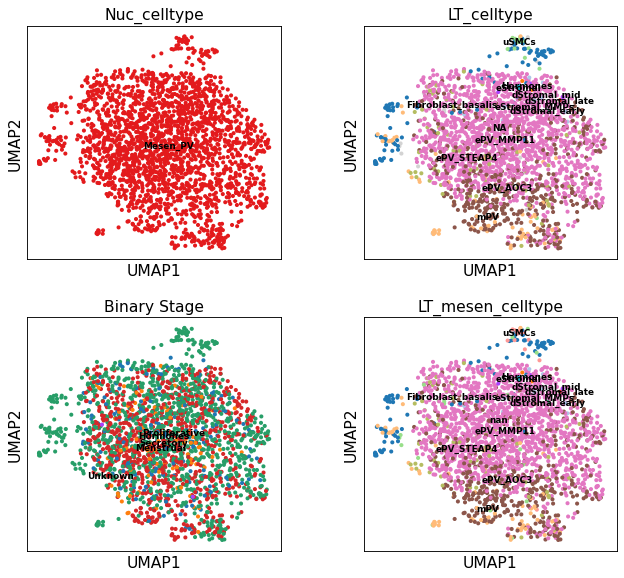

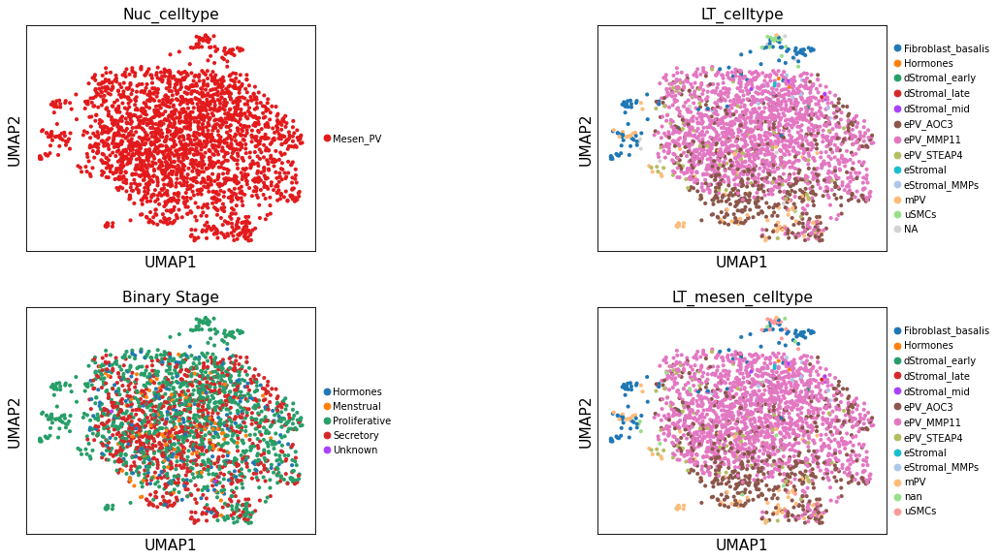

In [7]:
sc.pl.umap(adata, color=['Nuc_celltype', 'LT_celltype', 'Binary Stage', 'LT_mesen_celltype'], ncols = 2, legend_loc='on data', legend_fontsize=8)
sc.pl.umap(adata, color=['Nuc_celltype', 'LT_celltype', 'Binary Stage', 'LT_mesen_celltype'], ncols = 2, wspace=0.8, legend_fontsize=9)

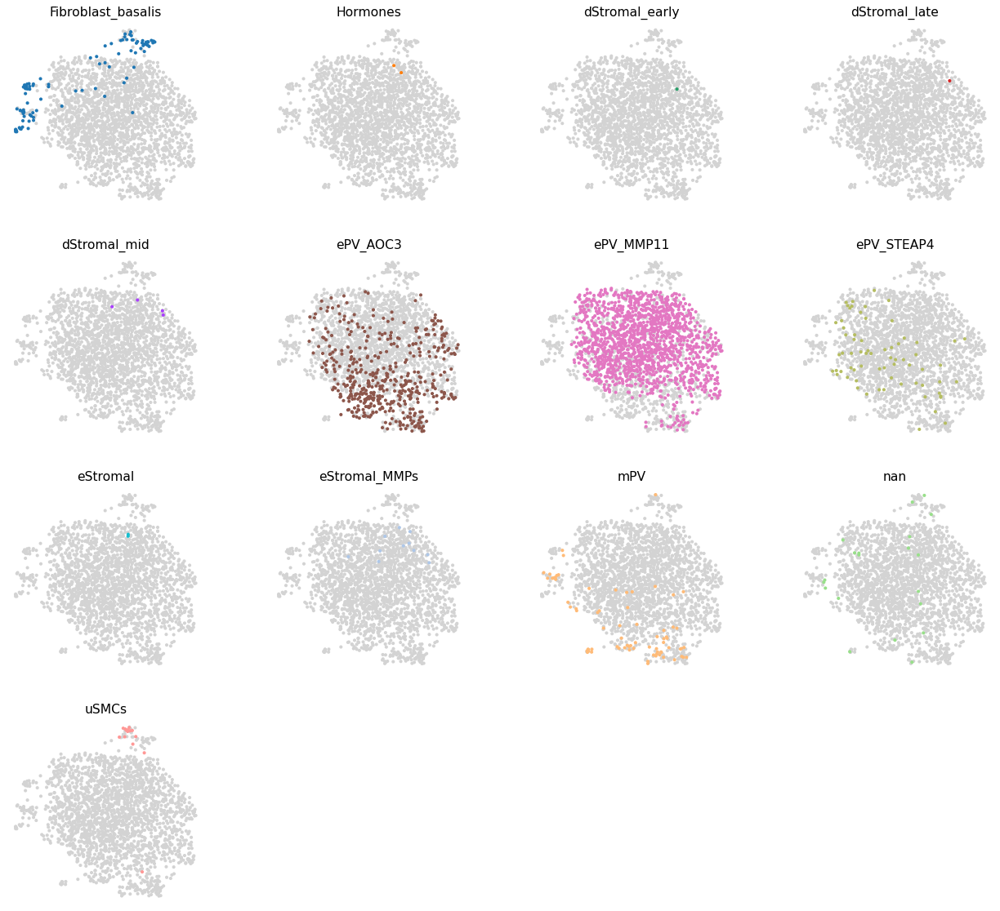

In [8]:
cluster_small_multiples(adata, 'LT_mesen_celltype')

nan


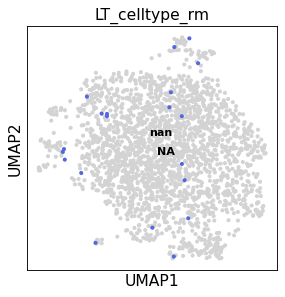

Fibroblast_basalis


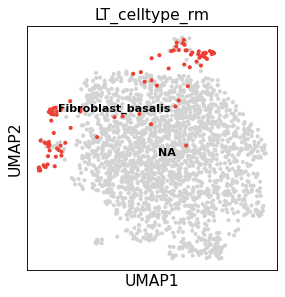

Hormones


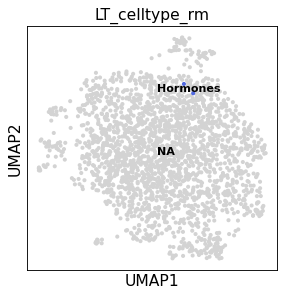

mPV


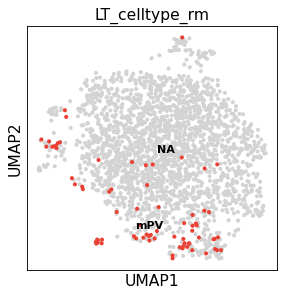

uSMCs


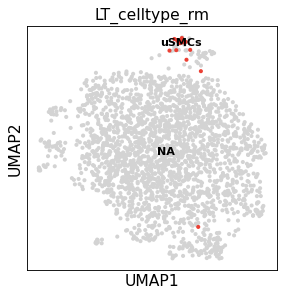

ePV_MMP11


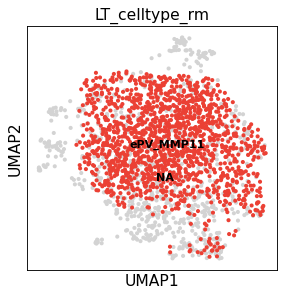

dStromal_mid


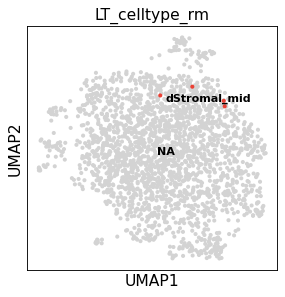

ePV_AOC3


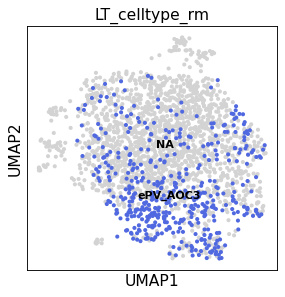

eStromal


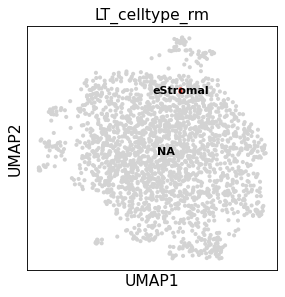

dStromal_late


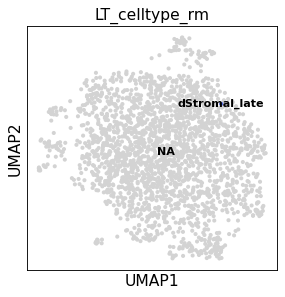

eStromal_MMPs


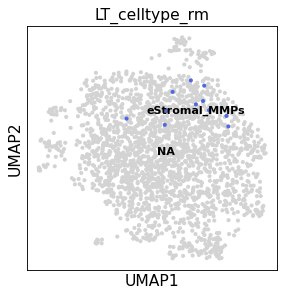

dStromal_early


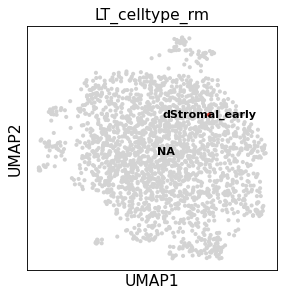

ePV_STEAP4


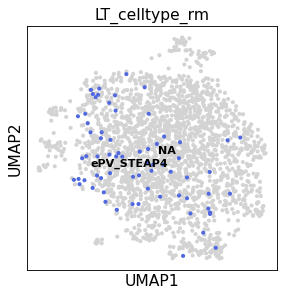

In [9]:
adata.obs['LT_celltype_rm'] = adata.obs.LT_mesen_celltype
for lin in set(adata.obs.LT_celltype):
    lin = str(lin)
    print(lin)
    sc.pl.umap(adata,
        groups=[lin],
        color=['LT_celltype_rm'],
        palette=['#eb4034', '#5169e0'],
        frameon=True, legend_loc='on data', legend_fontsize=10,
    )

## Clustering the graph
As Seurat and many others, we use the leiden graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by Levine et al. (2015).

In [16]:
sc.tl.leiden(adata, resolution=0.5)

running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


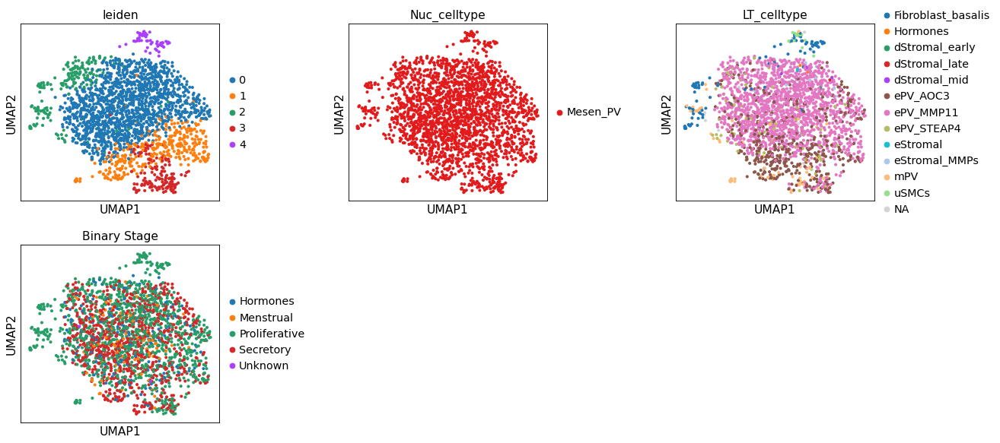

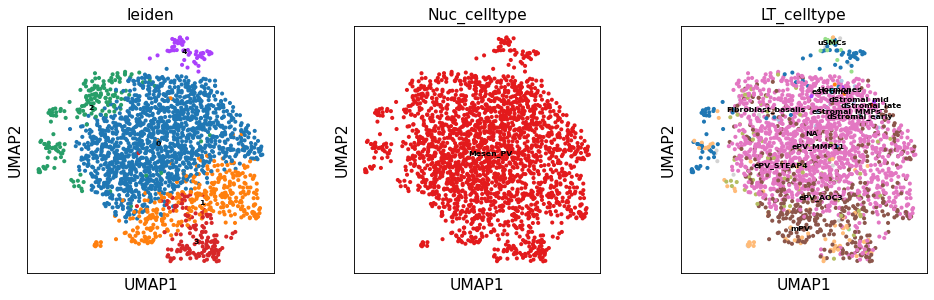

In [17]:
sc.pl.umap(adata, color=['leiden', 'Nuc_celltype', 'LT_celltype', 'Binary Stage'], wspace=0.5, ncols=3)
sc.pl.umap(adata, color=['leiden', 'Nuc_celltype', 'LT_celltype'],legend_loc='on data', legend_fontsize=7)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


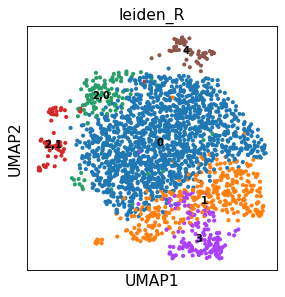

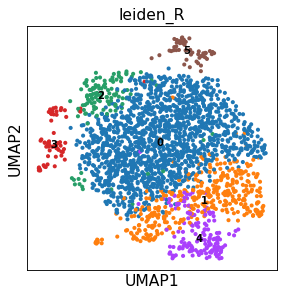

In [18]:
# recluster
sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['2']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

# Explore leiden clusters
### Visualize general markers

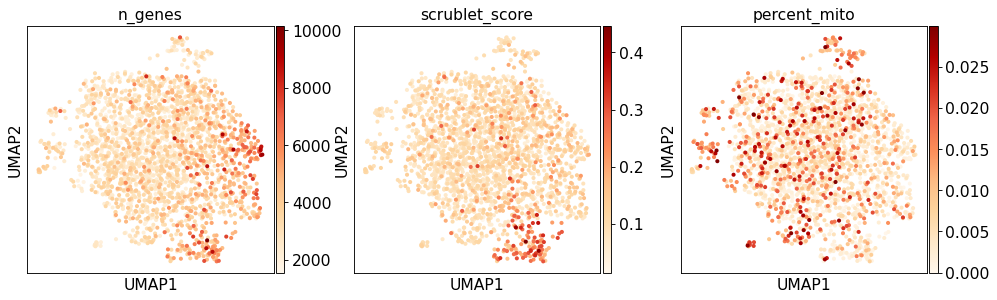

In [19]:
sc.pl.umap(adata, color=['n_genes','scrublet_score', 'percent_mito'], color_map='OrRd')

In [20]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [21]:
marker_genes = {
    'PV lineage': {"PDGFRA", 'OGN','DCN', 'LUM'},
#     'PV stem cells':{'NANOG', 'POU5F1'},
    'eS':{'MMP11', 'CRABP2',  'KLK1', 'TUNAR', 'SFRP1', 'FOXL2', 'TGFBI', 'F13A1'}, #'ECM1',
    'eS MMPs':{'CEMIP', 'INHBA', 'MMP10','MMP3', 'MMP1', 'COL8A1', 'BMP2', 'STC1'},
    'eS-dS/P4-induced':{'CILP', 'CALB2', 'PCSK6', 'RND2', 'NTRK3'},
    'dS':{'C3', 'DKK1', 'IL15', 'PALMD', 'CFD',  'TMEM37', 'LMCD1', 'PLA2G2A',  'IL15', 'PAEP'},     
    'dS mid':{'SCGB2A1', 'SCGB1D2', 'CXCL13', 'GABRA2', 'TLR4'},
    'dS late':{'SMAD7',  'GNG4','CXCL8', 'CXCL2', 'IGFBP1', 'TRIB1',  'TNFAIP3', 'TNFAIP2'},     
    'dS menstrual':{'SIGLEC7', 'PRL', 'HSD11B1', 'CRLF1', 'CFH'},
    'dS other':{'HBEGF', 'FOSL1', 'EGR3', 'BACH2',  'FGFR1',  'NFATC2'},  
#     'dS CRISP3':{'CRISP3', 'SLPI'},
    'PV lineage':{'MYH11', 'ACTA2', "MCAM", 'RGS5'},
    'ePV':{'ADGRF5'},
    'ePV STEAP4':{'STEAP4', 'ARHGAP15', 'SSTR2', 'SMTNL2'},
    'ePV MMP11':{'MMP11', 'TDO2', 'LPL', 'CYGB', 'SUSD2'},
    "ePV AOC3":{'AOC3', 'SLC38A11', 'CCND1', 'OR51E1' , 'MYOM2', 'FNDC1', 'NTRK2', 'NET1', 'MAP3K7CL', 'NRARP', 'STC2'},
    'mPV MYH11':{'RERGL', 'KCNAB1', 'NTRK2', 'FHL5'},
    'PV lessions CCL19':{'CCL19'},
    'Fibroblast C7': {'C7', 'SCN7A', 'PTGIS'},
    'vascularSMCs':{'SBSPON', 'IGFBP5'},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11', 'DES', 'PCP4', 'PTGER2', 'PTGER3'},
    'HOXA13':{'CXCL14', 'PGF', 'BMP7', 'HOXA13'},
    'non-vascularSMCs':{'AREG', 'P2RY14'},
    'Epithelial lineage': {'EPCAM', 'PAX8'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
#     'MUC5B+':{"MUC5B", "STRA6", "LTF", "BPIFB1"},
#     'KRT5/TP63':{'KRT5', 'TP63', 'SNCG'},
    'WIF1':{'WIF1'},
    'P4 withdrawal':{'PTGS2', 'CCL2', 'CXCL8'},
#     'Prostaglandin R':{'PTGER4','PTGFR', 'PTGER3', 'PTGIR', 'PTGDR', 'PTGDR2', 'PTGER1', 'PTGER2'},
#     'Prostaglandin S':{ 'PTGES', 'HPGDS', 'PTGS1', 'TBXAS1', 'PTGS2', 'PTGDS', 'PLA2G4A', 'PTGES3', 'PTGIS', 'PTGES2'},
    'HOXA':{'HOXA9', 'HOXA10', 'HOXA11', 'HOXA13', 'HOXD9', 'HOXD10', 'HOXD10', "HOXC4", "HOXC6", "HOXD11"},
    'dS Inflamatory':{"IL15"},
    'MUC5B': {'MUC5B'},
    'lowQC': {"HBA1", "HBA2"}
}

marker_genes_short = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},    
#     'Mesothelial': {'UPK3B', 'LRRN4'},
    'PV lineage': {"PDGFRA", 'OGN'}, # 'DCN', 'LUM'
    'PV lineage':{'MYH11', 'ACTA2', "MCAM"},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"}
}

PV lineage


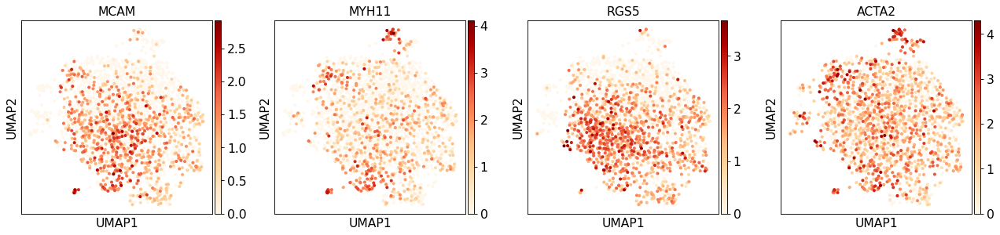

eS


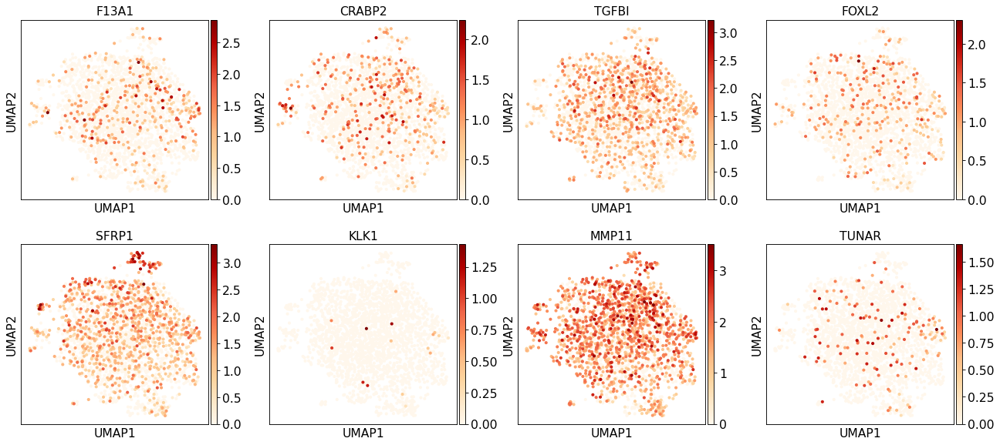

eS MMPs


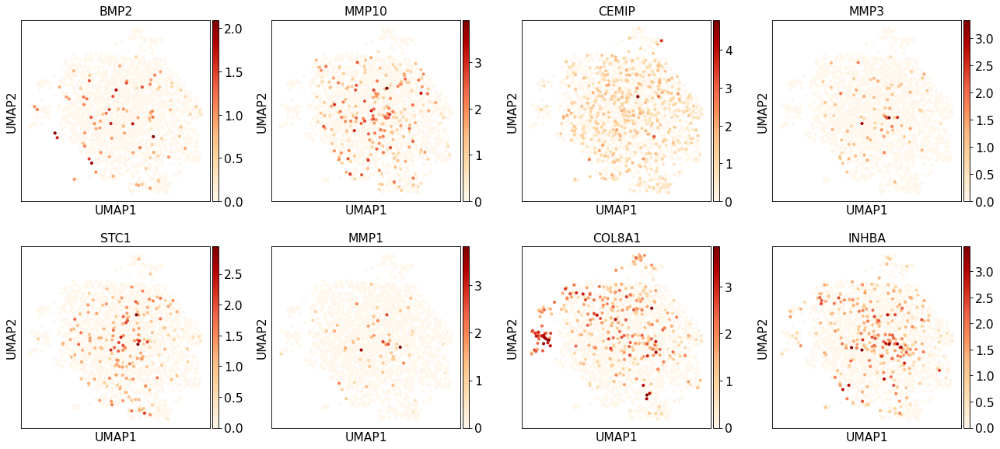

eS-dS/P4-induced


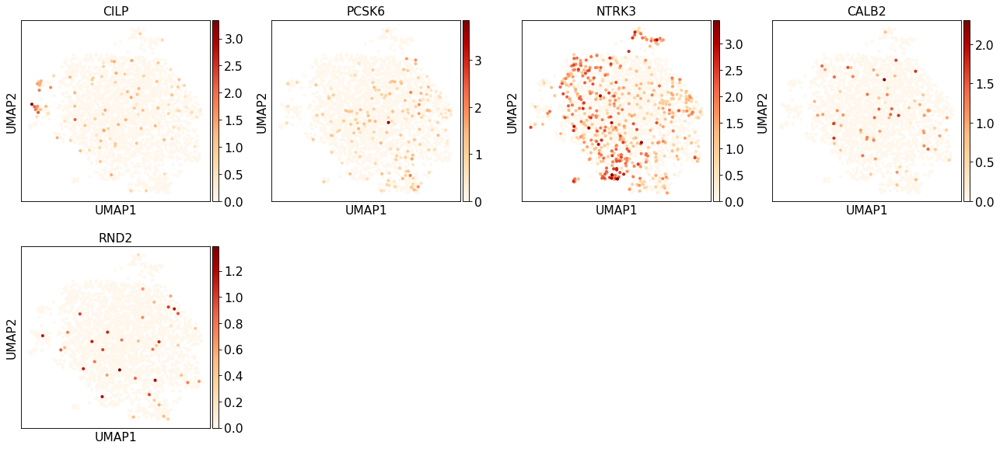

dS


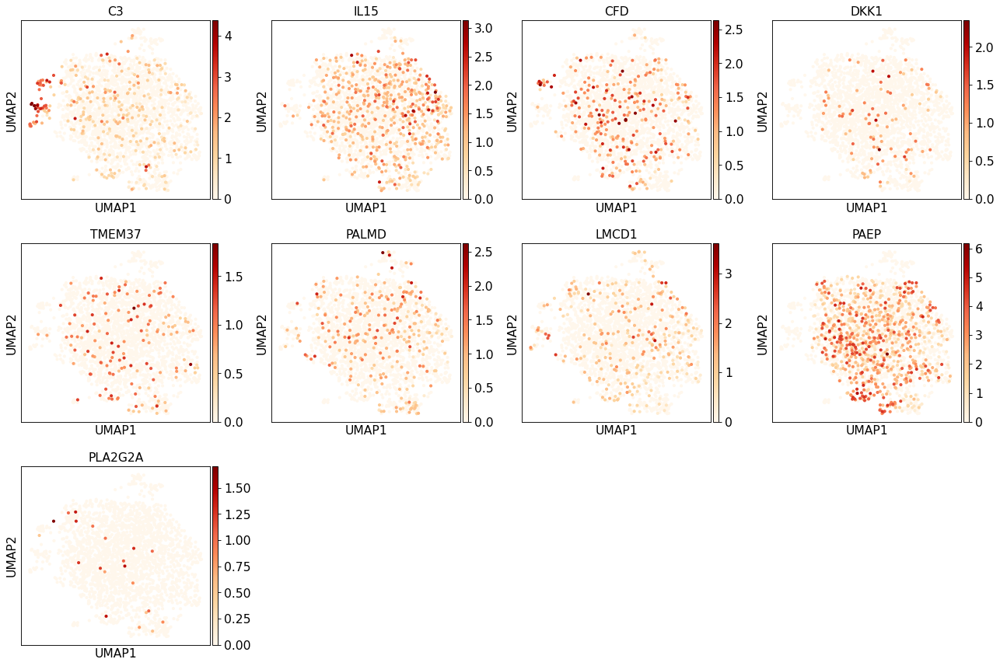

dS mid


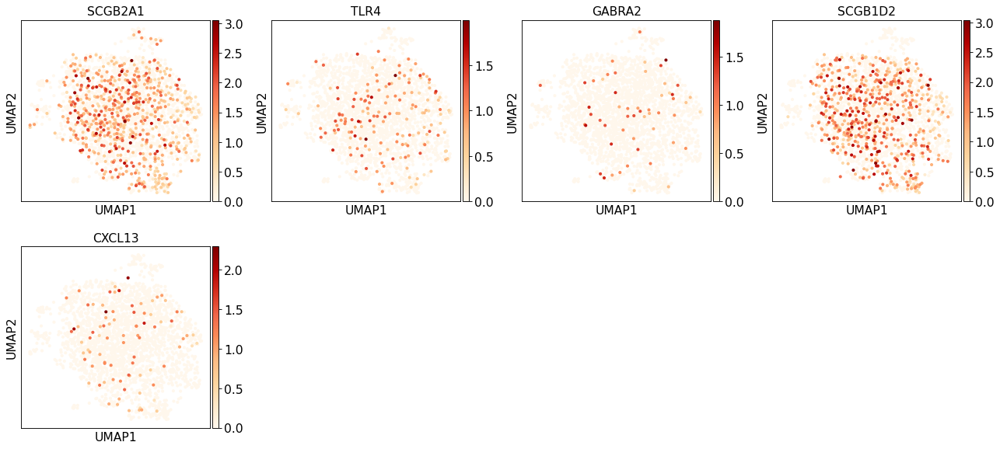

dS late


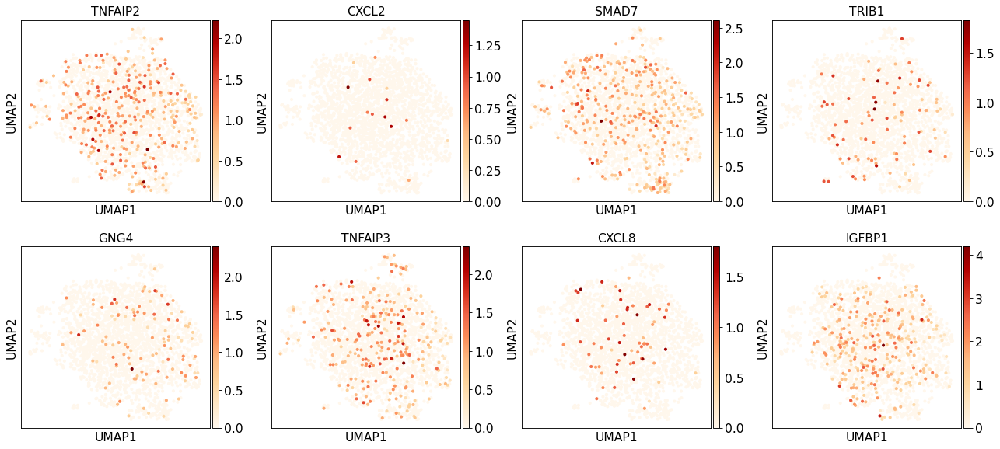

dS menstrual


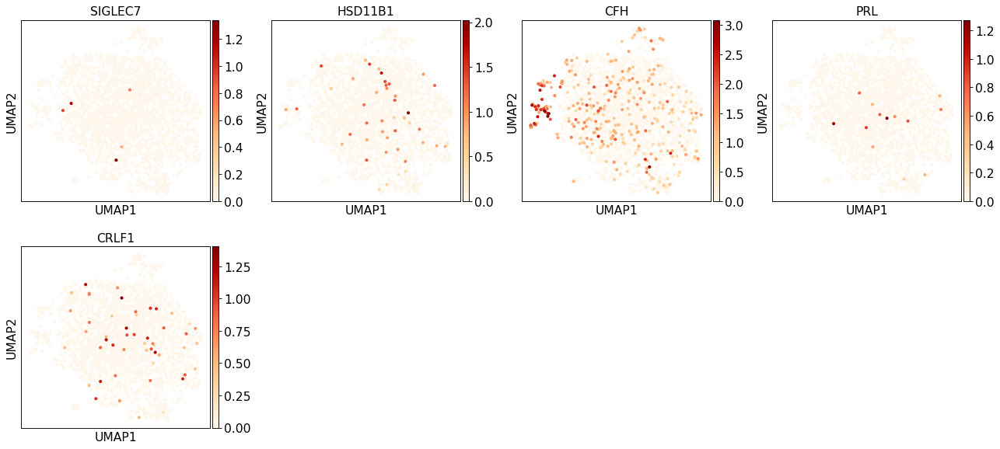

dS other


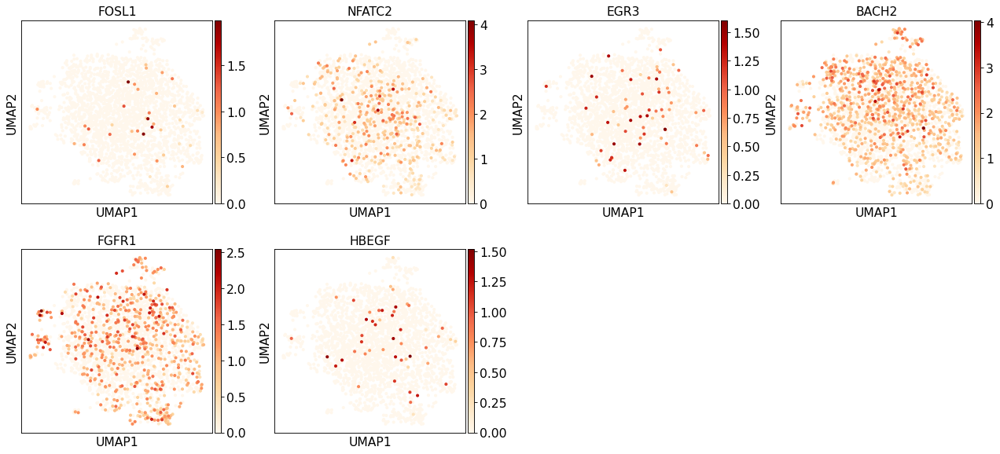

ePV


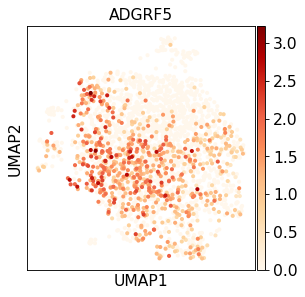

ePV STEAP4


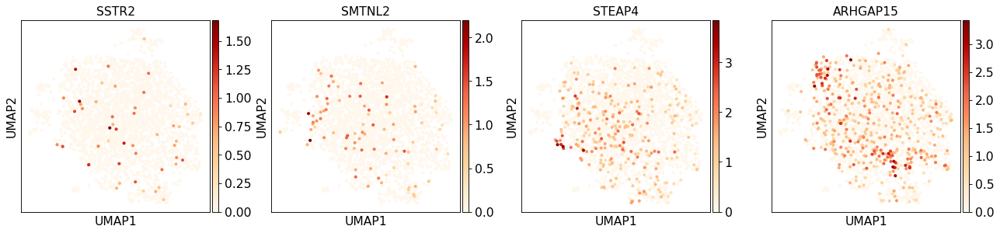

ePV MMP11


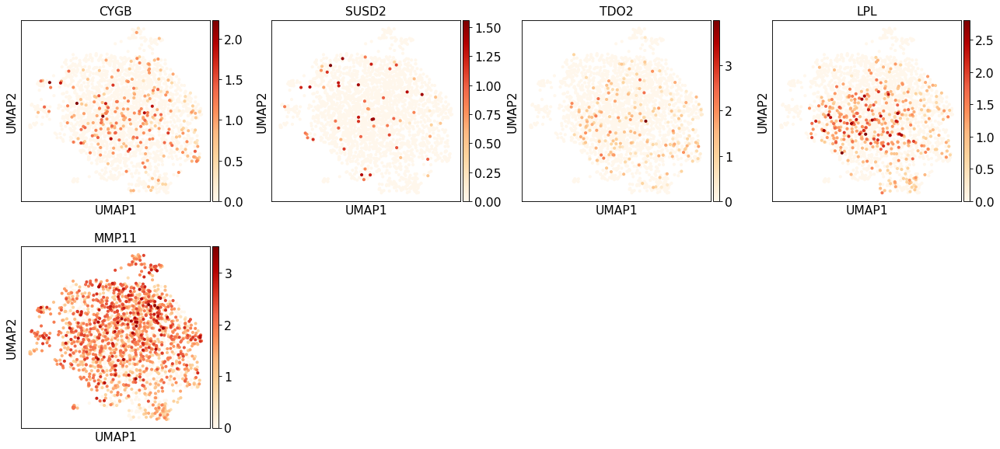

ePV AOC3


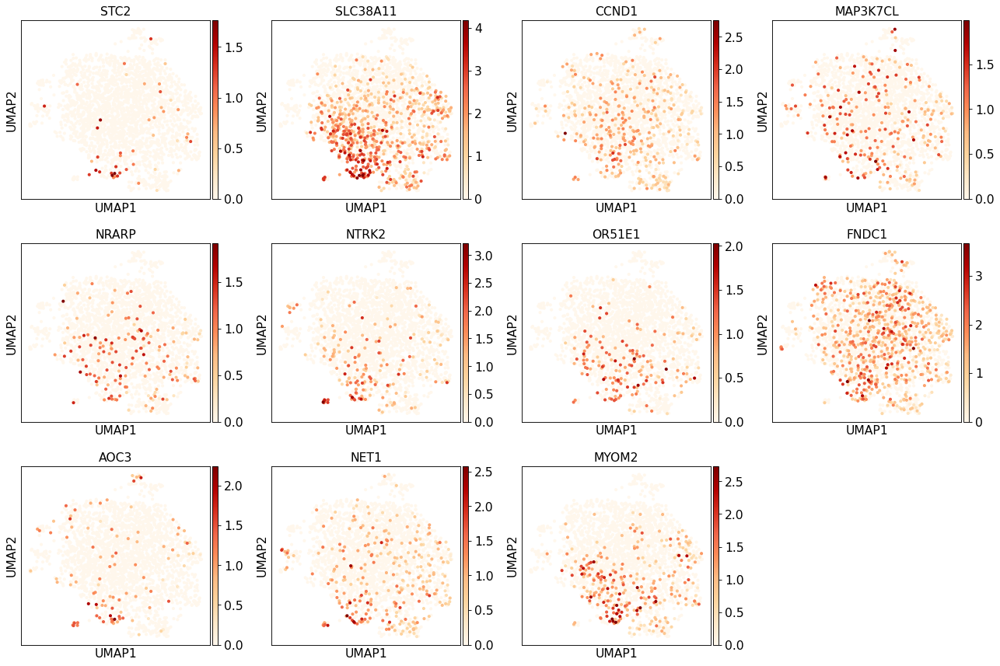

mPV MYH11


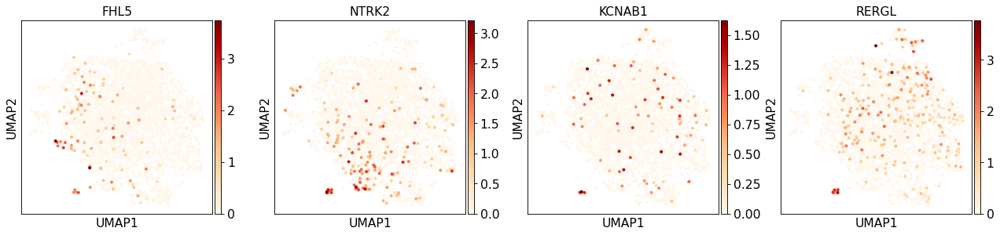

PV lessions CCL19


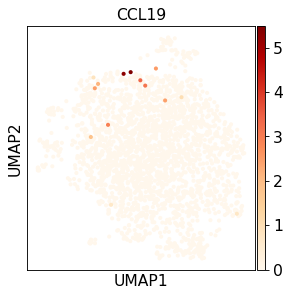

Fibroblast C7


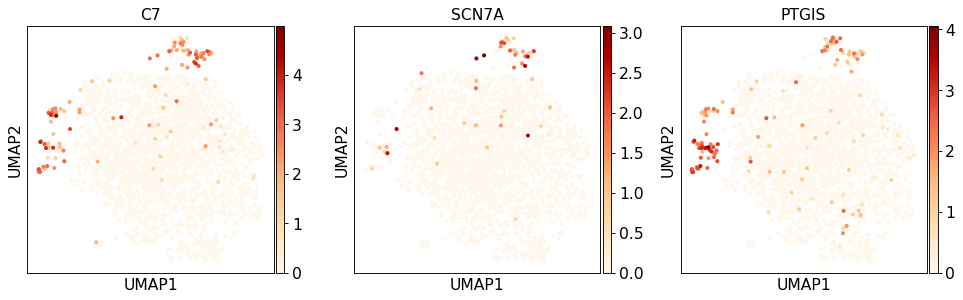

vascularSMCs


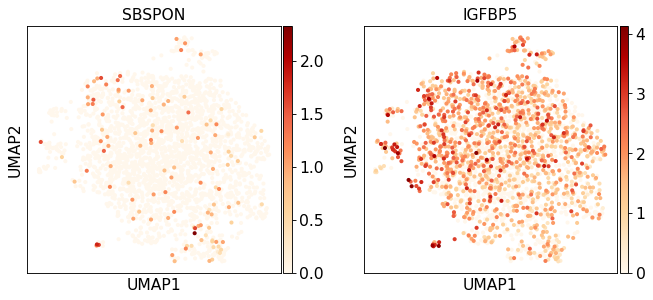

uSMCs


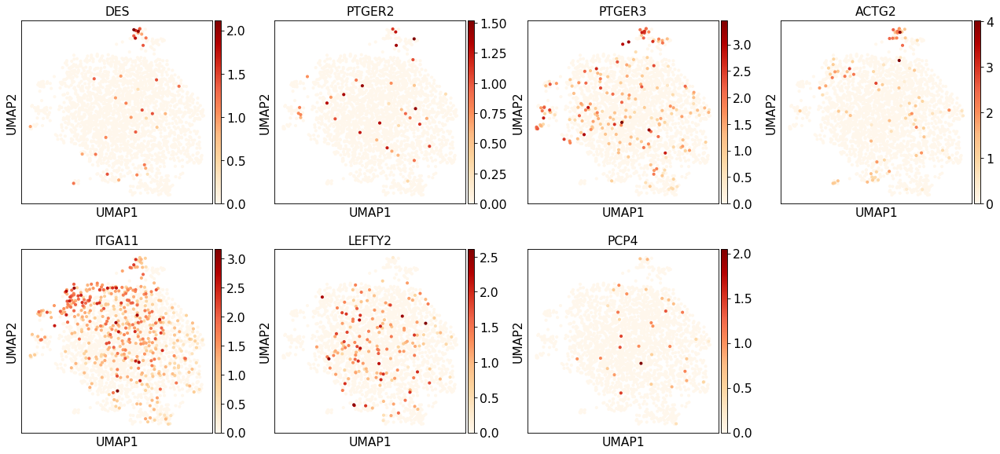

HOXA13


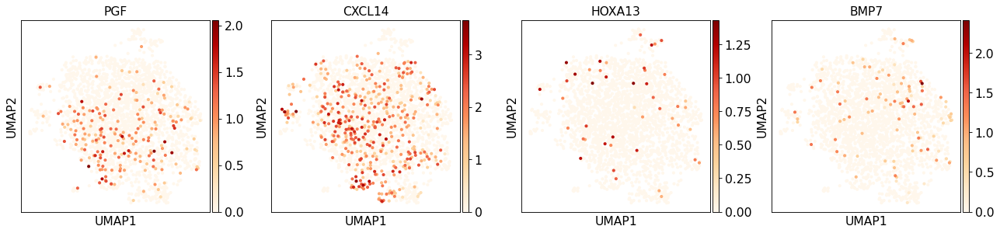

non-vascularSMCs


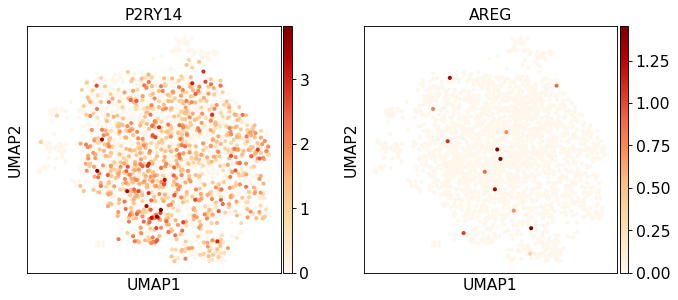

Epithelial lineage


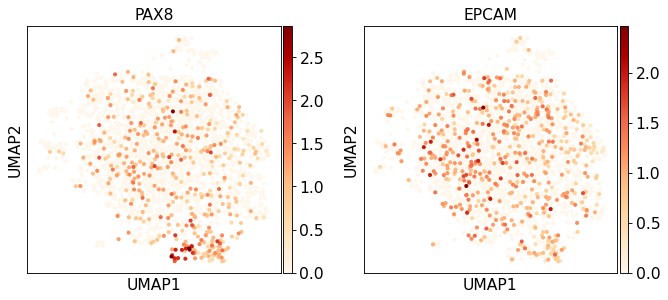

Endothelial


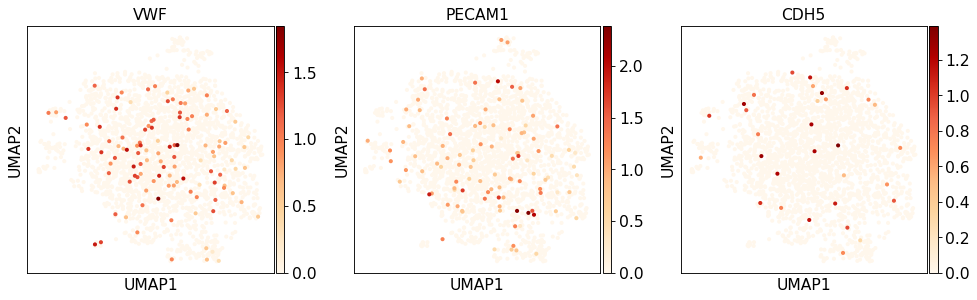

Immune


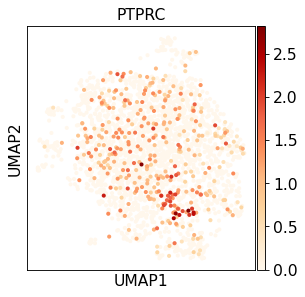

Lymphoid


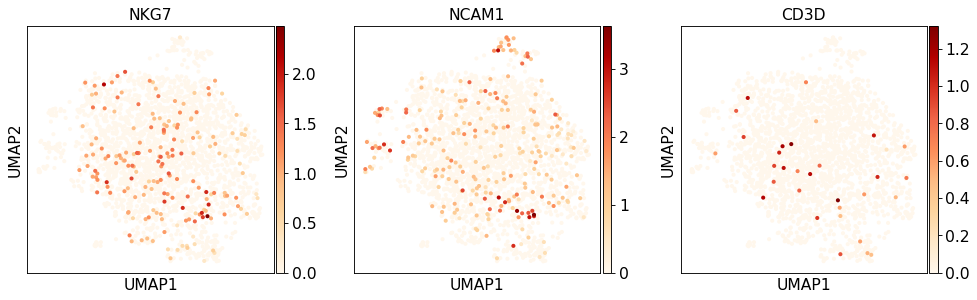

Myeloid


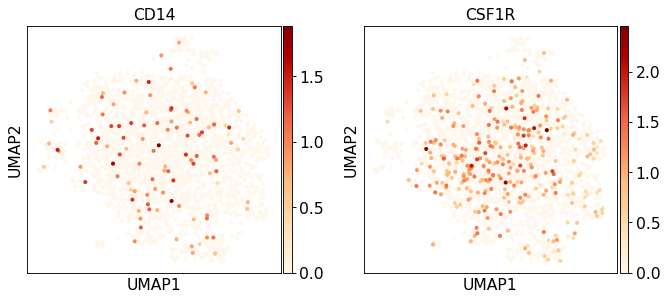

WIF1


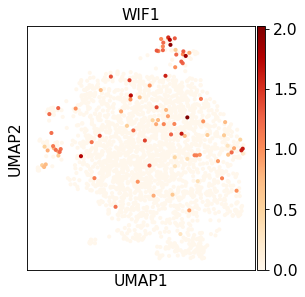

P4 withdrawal


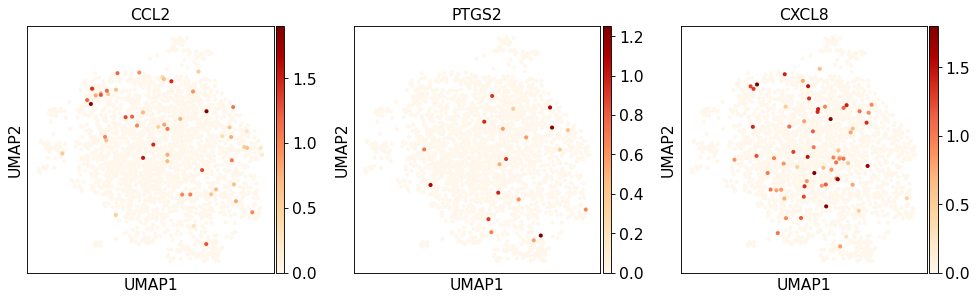

HOXA


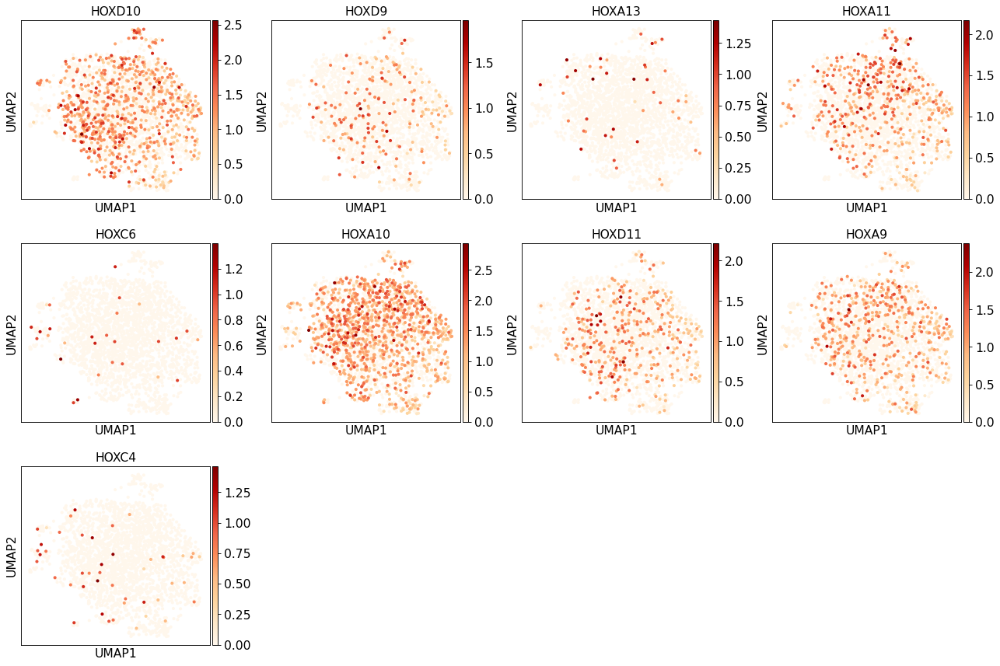

dS Inflamatory


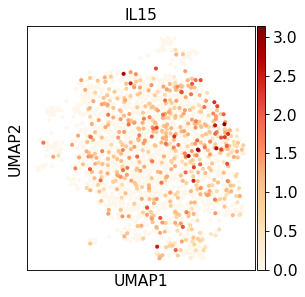

MUC5B


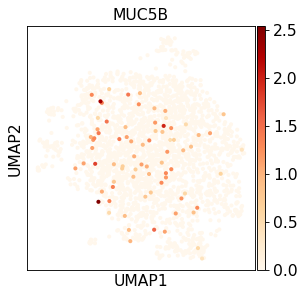

lowQC


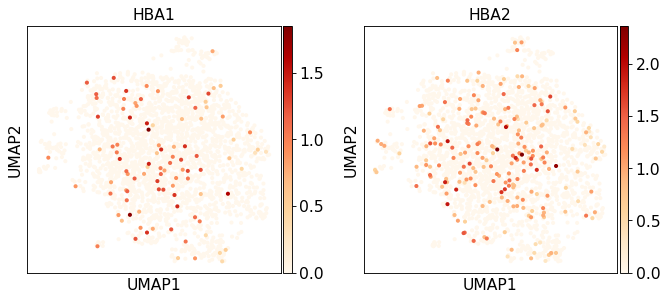

In [22]:
for i in marker_genes.keys():
    print(i)
    sc.pl.umap(adata, color=marker_genes[i], color_map='OrRd', use_raw=False )

### Check global trends

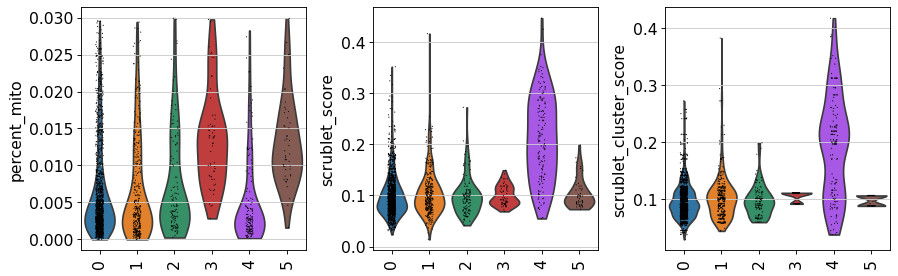

In [24]:
sc.pl.violin(adata, keys= ['percent_mito', 'scrublet_score', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)

# Finding marker genes

Compute a ranking for the highly differential genes in each cluster. Here, we simply rank genes with a t test, which agrees quite well with Seurat.

## All vs rest

In [25]:
# # Compute Mann-Withney test with scanpy
# sc.tl.rank_genes_groups(adata, groupby='leiden', use_raw=False) #, method='logreg'
# # Plot
# sc.pl.rank_genes_groups_dotplot(adata, n_genes=20, dendrogram=False, save='_scanpy.pdf', standard_scale = 'var')

In [26]:
def Barplot(which_var, adata, var='lineage', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
                       dpi=300, orientation='landscape', format= 'pdf', optimize=True)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

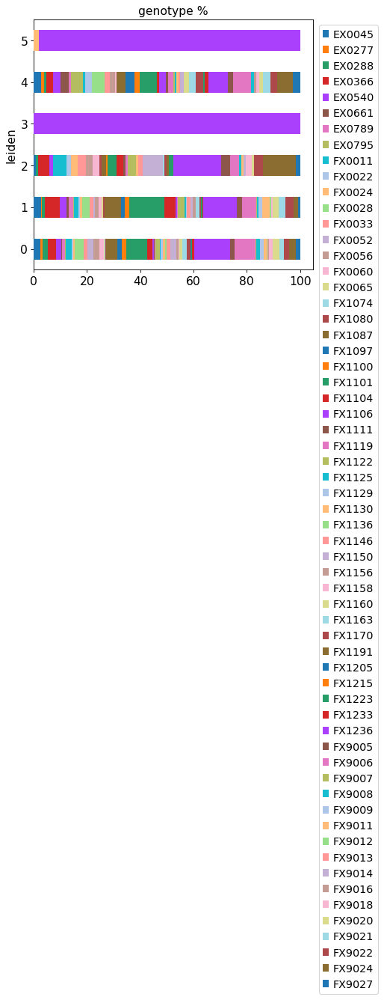

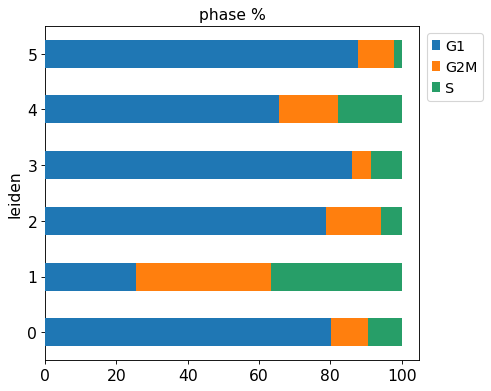

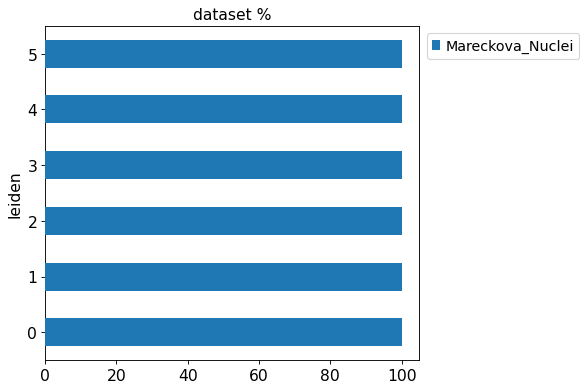

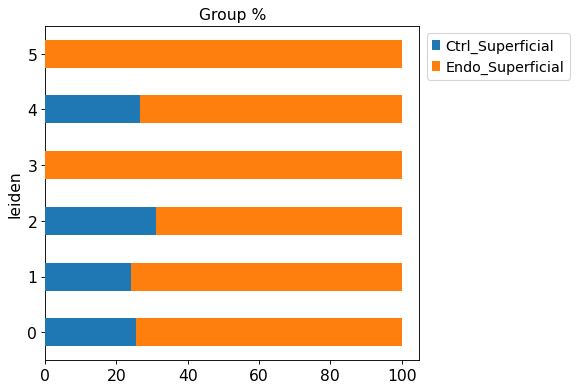

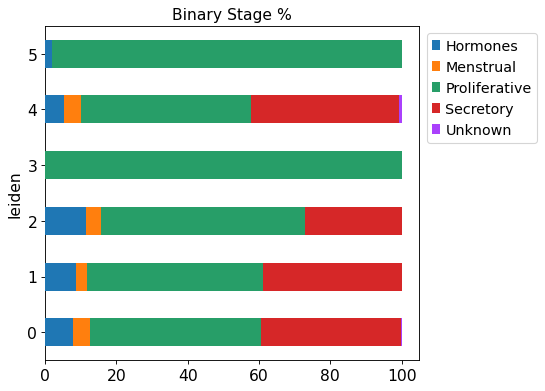

In [27]:
Barplot('genotype', adata, var='leiden', height=5.5)
Barplot('phase', adata, var='leiden', height=5.5)
Barplot('dataset', adata, var='leiden', height=5.5)
Barplot('Group', adata, var='leiden', height=5.5)
Barplot('Binary Stage', adata, var='leiden', height=5.5)

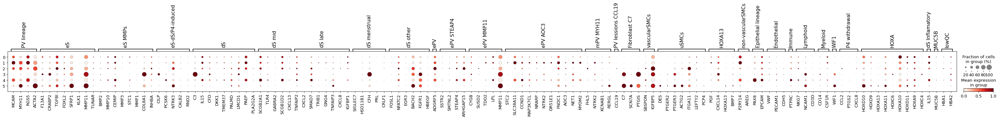

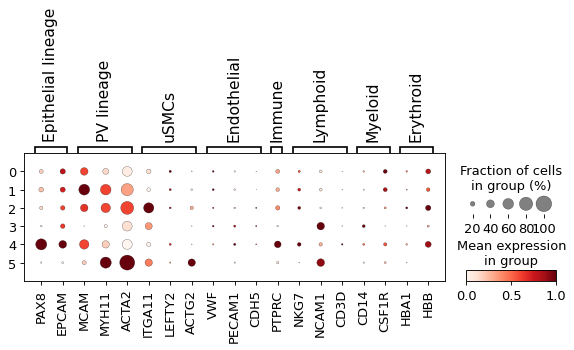

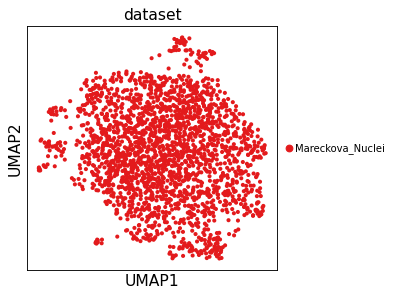

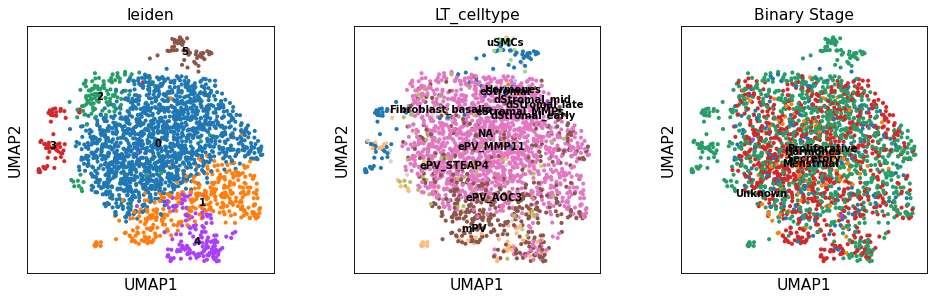

In [28]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', standard_scale='var', save='MARKERS_leiden.pdf')
sc.pl.dotplot(adata, marker_genes_short, groupby='leiden', standard_scale='var')

sc.pl.umap(adata, color=['dataset'], legend_fontsize=9)
sc.pl.umap(adata, color=['leiden',  'LT_celltype','Binary Stage'],legend_loc='on data', legend_fontsize=9, save='_leiden.pdf')

# Cell's Annotation

... storing 'Nuc_pv_celltype' as categorical
... storing 'Nuc_pv_lineage' as categorical


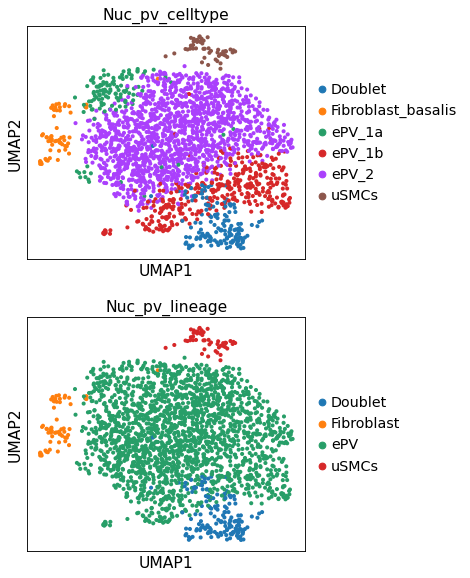

In [51]:
adata.obs['Nuc_pv_celltype'] = adata.obs['leiden'].tolist()
adata.obs.at[adata.obs['Nuc_pv_celltype'] == '0', 'Nuc_pv_celltype'] = 'ePV_2'
adata.obs.at[adata.obs['Nuc_pv_celltype'] == '1', 'Nuc_pv_celltype'] = 'ePV_1b'
adata.obs.at[adata.obs['Nuc_pv_celltype'] == '2', 'Nuc_pv_celltype'] = 'ePV_1a'
adata.obs.at[adata.obs['Nuc_pv_celltype'] == '3', 'Nuc_pv_celltype'] = 'Fibroblast_basalis'
adata.obs.at[adata.obs['Nuc_pv_celltype'] == '4', 'Nuc_pv_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Nuc_pv_celltype'] == '5', 'Nuc_pv_celltype'] = 'uSMCs'


set(adata.obs['Nuc_pv_celltype'])
adata.obs['Nuc_pv_lineage'] = [str(i).split('_', 1)[0] for i in adata.obs['Nuc_pv_celltype'] ]

sc.pl.umap(adata, color=['Nuc_pv_celltype', 'Nuc_pv_lineage'], ncols=1)
# adata.obs['Nuc_pv_celltype'].cat.reorder_categories(['Epithelial', 'Epithelial_MUC5B', 'Epithelial_Glands', 'Epithelial_Ciliated', 'Epithelial_TP63+KRT5+',
#                                                         'Mesothelial', 
#                                                         'PV_eS', 'PV_dS', 'PV_C7', 
#                                                         'PV_STEAP4', 'PV_MYH11', 'uSMCs',
#                                                         'Endothelial', 'Endothelial_LEC', 'Myeloid', 'Lymphoid',
#                                                         'EcO_PV',
#                                                         'EcO_PV_COL10A1'
#                                                         'EcO_Granulosa', 'EcO_Theca',
#                                                         'LowQC', 'Doublet'], inplace=True)

# sc.pl.umap(adata, color=['Nuc_pv_celltype'])

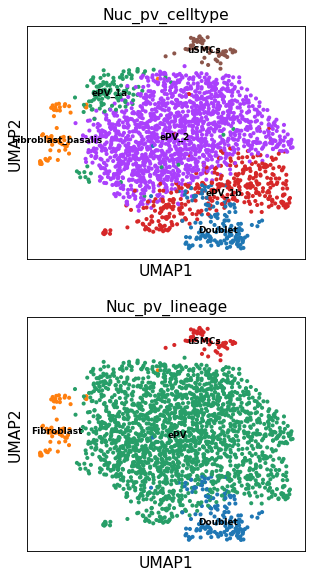

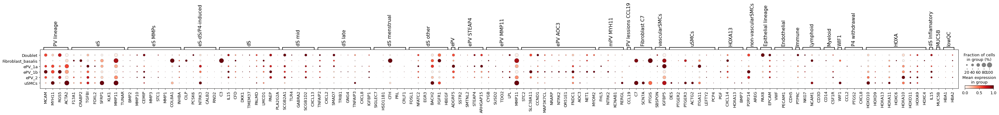

... storing 'leiden_celltype' as categorical
... storing 'celltype_leiden' as categorical


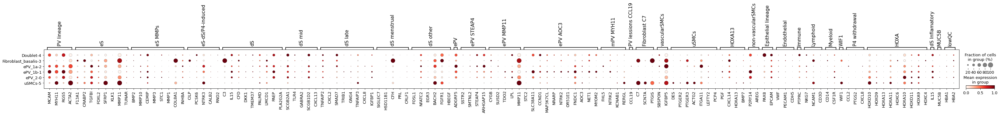

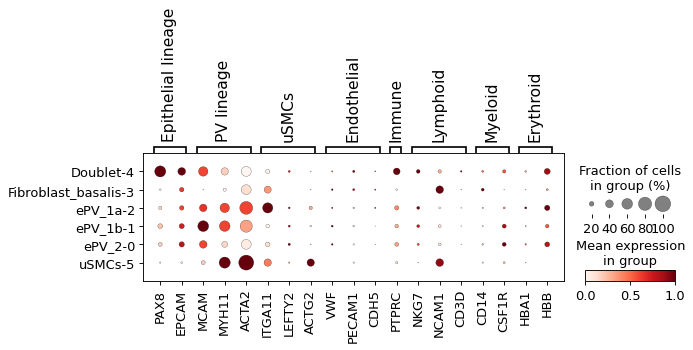

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

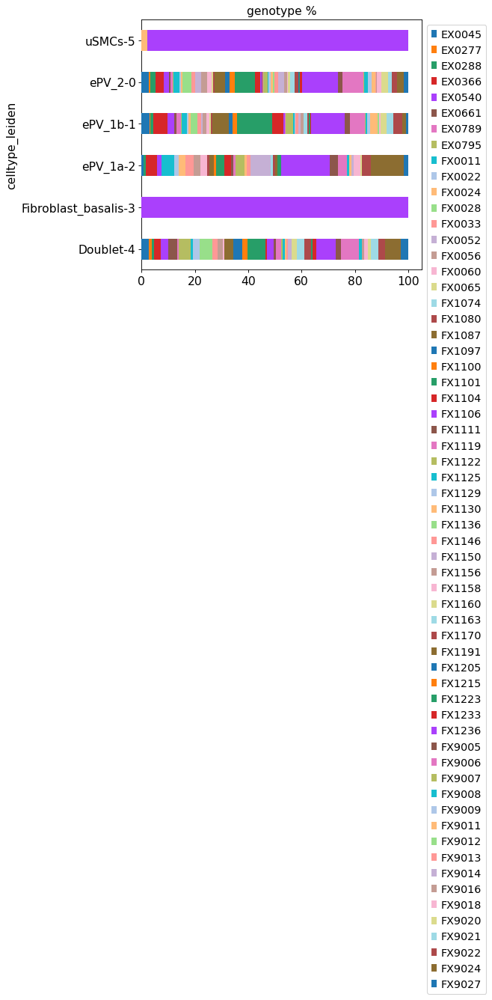

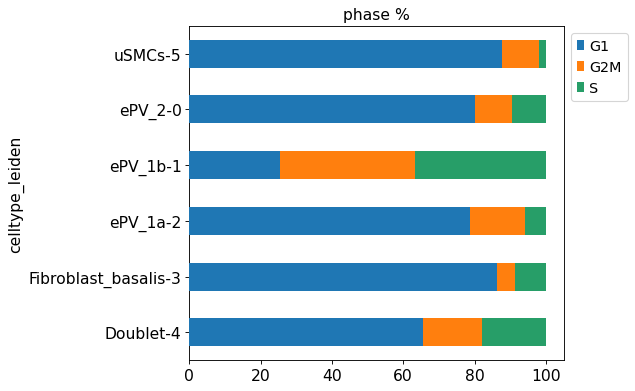

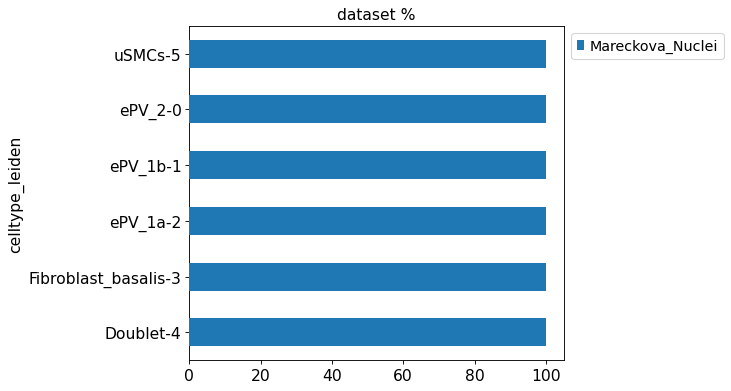

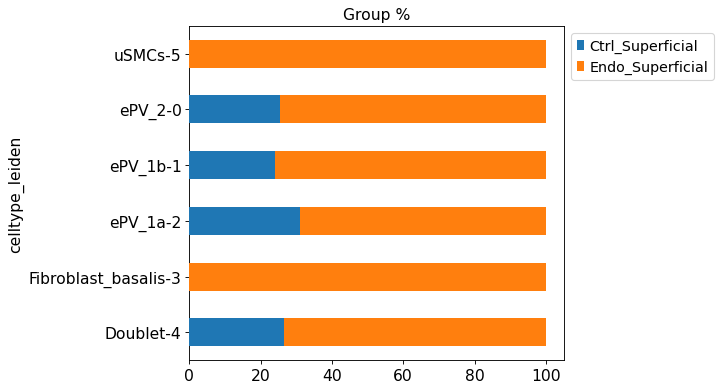

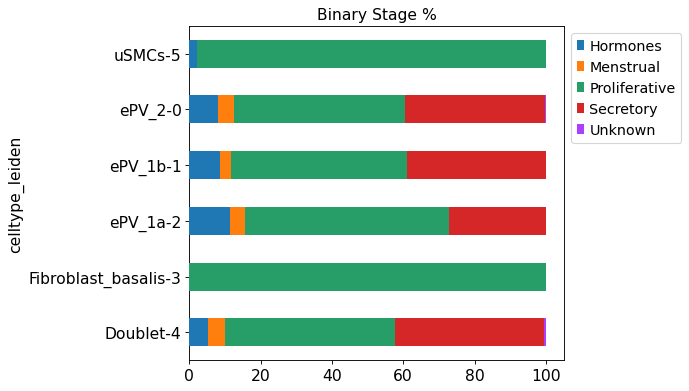

In [52]:
sc.pl.umap(adata, color=['Nuc_pv_celltype', 'Nuc_pv_lineage'], legend_loc='on data', legend_fontsize=8, ncols=1, save='_PV_celltype.pdf')
sc.pl.dotplot(adata, marker_genes, groupby='Nuc_pv_celltype', standard_scale='var', save='MARKERS_celltype.pdf')

adata.obs['leiden_celltype'] =  [a + '-' + b  for a, b in zip(adata.obs['leiden'], adata.obs['Nuc_pv_celltype'])]
adata.obs['celltype_leiden'] =  [a + '-' + b  for b, a in zip(adata.obs['leiden'], adata.obs['Nuc_pv_celltype'])]

sc.pl.dotplot(adata, marker_genes, groupby='celltype_leiden', standard_scale='var')
sc.pl.dotplot(adata, marker_genes_short, groupby='celltype_leiden', standard_scale='var')


Barplot('genotype', adata, var='celltype_leiden', height=5.5)
Barplot('phase', adata, var='celltype_leiden', height=5.5)
Barplot('dataset', adata, var='celltype_leiden', height=5.5)
Barplot('Group', adata, var='celltype_leiden', height=5.5)
Barplot('Binary Stage', adata, var='celltype_leiden', height=5.5)

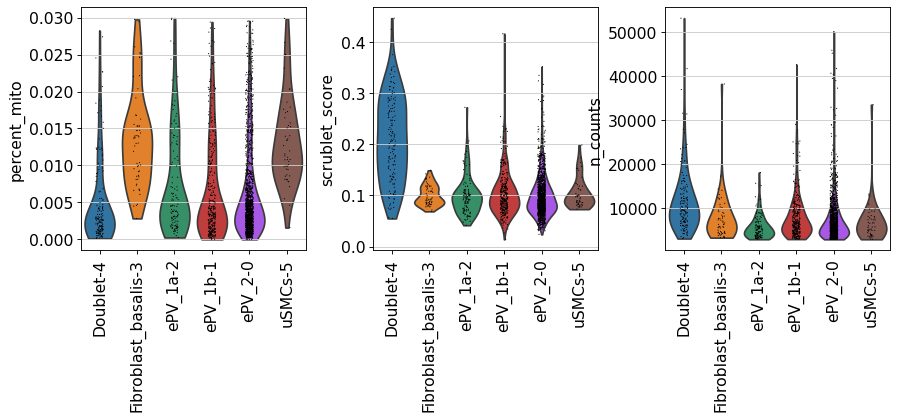

In [72]:
sc.pl.violin(adata, keys= ['percent_mito', 'scrublet_score', 'n_counts'], groupby = 'celltype_leiden', rotation = 90)

In [54]:
# adata.write('x.h5ad')
pd.DataFrame(adata.obs).to_csv('/nfs/team292/lg18/endometriosis/annotations/nuclei_endometrium_PV.csv')

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning

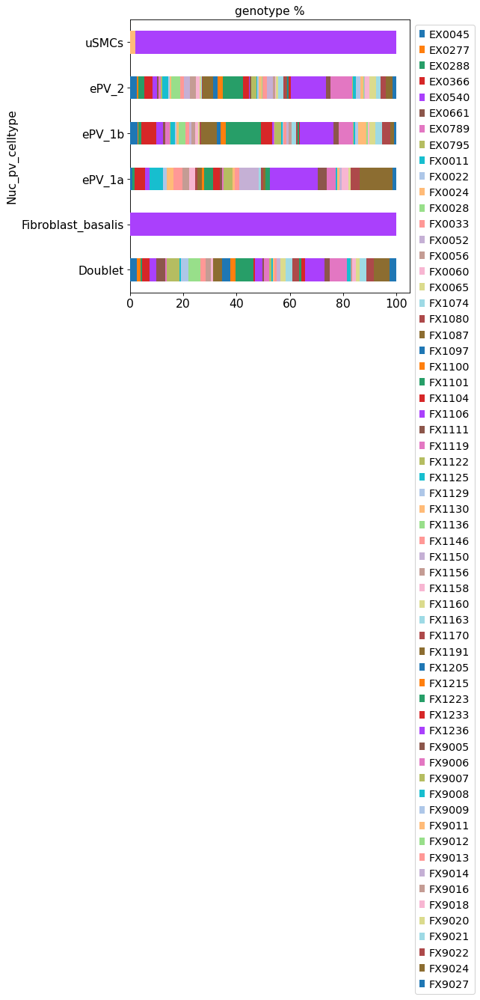

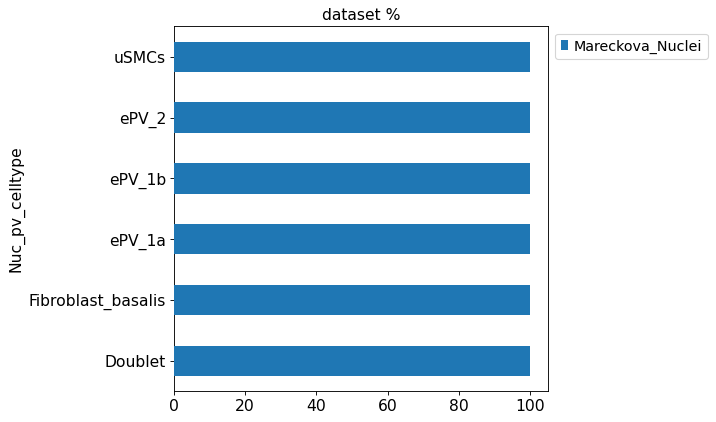

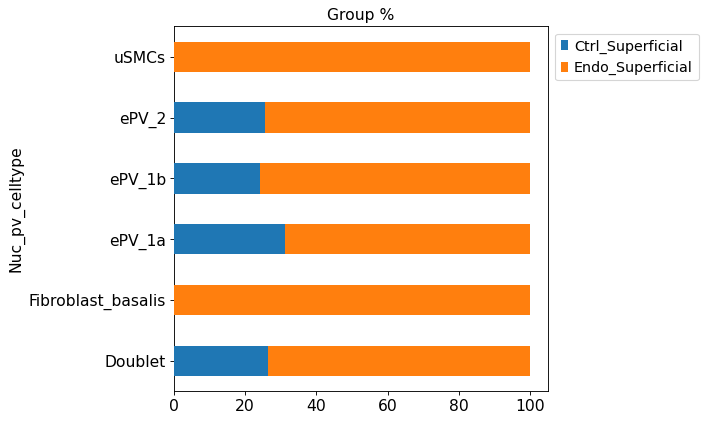

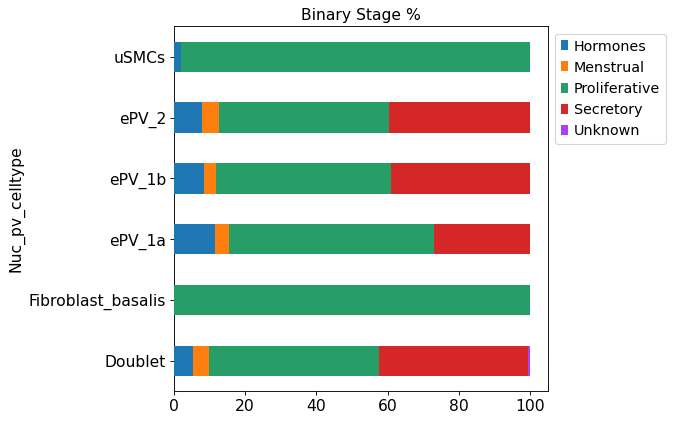

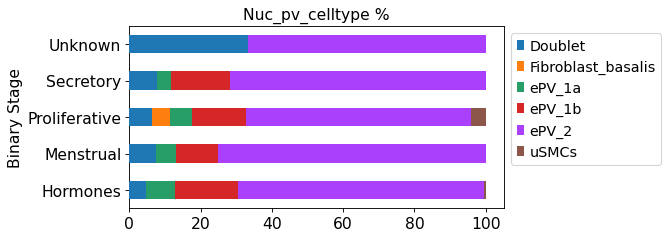

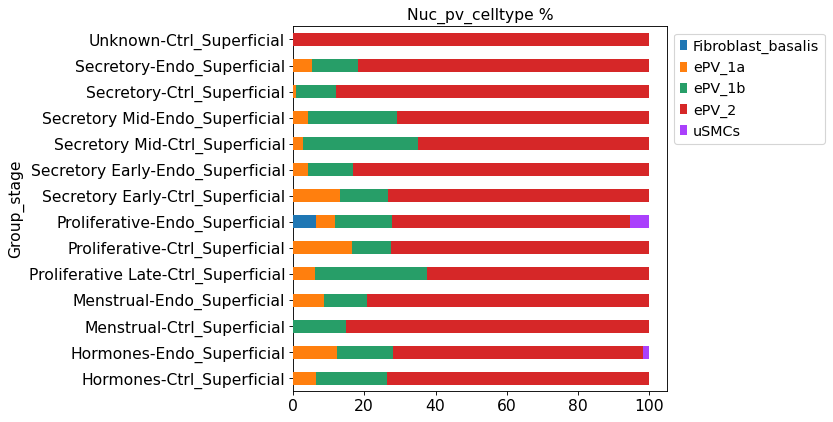

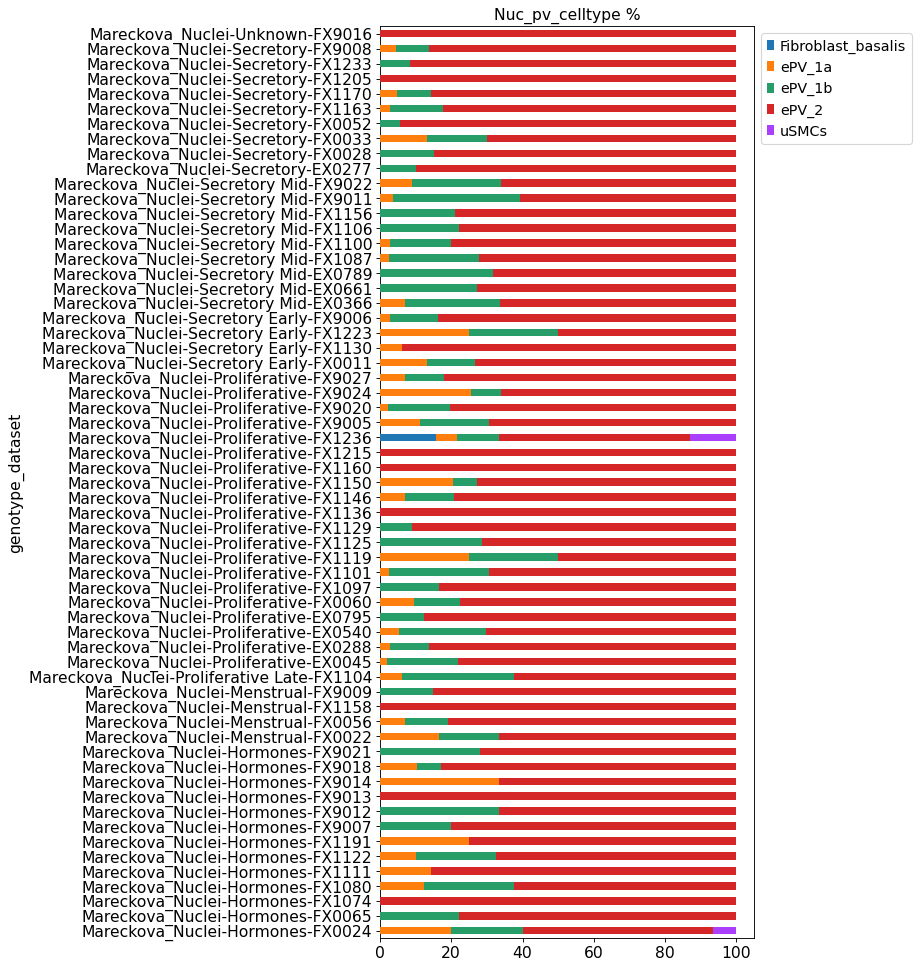

In [55]:
sampleID = [a + '-' + b + '-' + c  for a, b, c in zip(adata.obs['dataset'], adata.obs['Stage'],adata.obs['genotype'])]
adata.obs['genotype_dataset'] = sampleID

sampleID = [a + '-' + b  for a, b in zip(adata.obs['Stage'], adata.obs['Group'])]
adata.obs['Group_stage'] = sampleID

Barplot('genotype', adata, var='Nuc_pv_celltype', height=6)
Barplot('dataset', adata, var='Nuc_pv_celltype', height=6)
Barplot('Group', adata, var='Nuc_pv_celltype', height=6)
Barplot('Binary Stage', adata, var='Nuc_pv_celltype', height=6)
Barplot('Nuc_pv_celltype', adata, var='Binary Stage', height=3)


Barplot('Nuc_pv_celltype', adata[[ i not in ['Doublet', 'LowQC', 'Other'] for i in adata.obs.Nuc_pv_celltype ]], 
        var='Group_stage', height=6)
Barplot('Nuc_pv_celltype', adata[[ i not in ['Doublet', 'LowQC', 'Other'] for i in adata.obs.Nuc_pv_celltype ]], 
        var='genotype_dataset', height=15)

# TF-IDF

In [56]:
import anndata
adataDown = adata[[ i in ["G1"] for i in adata.obs.phase ]]
sc.pp.filter_cells(adataDown, min_genes=2000)
sc.pp.filter_genes(adataDown, min_cells=5)
# print(adataDown.obs['leiden'].value_counts())

### Dowsample the whole dataset UN-EVEN
# adataDown = sc.pp.subsample(XX, fraction=0.25, random_state=0, copy=True) 


### Downsample to the smallest pop size
target_cells = 50

adataDown.obs['cell'] = adataDown.obs.index
adatas = [adataDown[adataDown.obs['leiden'].isin([cl])] for cl in adataDown.obs['leiden'].cat.categories]
# adatas = [adataDown[ adataDown.obs['leiden']==cl ] for cl in adataDown.obs['leiden'].cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells, random_state=0)
adata_downsampled = adatas[0].concatenate(*adatas[1:])
adataDown = adataDown[[ i in adata_downsampled.obs.cell.tolist() for i in adataDown.obs['cell'] ]]

sc.pp.filter_genes(adataDown, min_cells=10)
print(adataDown.obs['leiden'].value_counts())

del adata_downsampled
del adatas

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 58 cells that have less than 2000 genes expressed
Trying to set attribute `.obs` of view, copying.
filtered out 11044 genes that are detected in less than 5 cells
filtered out 8225 genes that are detected in less than 10 cells
Trying to set attribute `.var` of view, copying.


0    50
1    50
2    50
4    50
3    49
5    41
Name: leiden, dtype: int64


In [57]:
import rpy2.rinterface_lib.callbacks
import logging
# Itoliste R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [58]:
# This is just to allow moving adata to R without errors
adataDown.X = adataDown.X.toarray()

idx = ['n_genes', 'sample',  'percent_mito', 'n_counts', 'batch', 'S_score', 'G2M_score', 'phase', 
       'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet']
for i in idx:
    del adataDown.obs[i]
    
adataDown.obs['leiden'] = adataDown.obs['leiden'].astype(str)

del adataDown.obsm['X_scVI']
del adataDown.obsm['X_umap']
del adataDown.obsp['connectivities']
del adataDown.obsp['distances']
del adataDown.uns

In [59]:
%%R -i adataDown
adataDown

class: SingleCellExperiment 
dim: 14309 290 
metadata(0):
assays(1): X
rownames(14309): A1BG A1BG-AS1 ... ZYX ZZEF1
rowData names(164): gene_ids.0 feature_types.0 ... variances
  variances_norm
colnames(290): UA_Endo12449299_CCTCACACAAACCACT
  UA_Endo11596522_CACTTCGGTAACGCGA ... UA_Endo11596521_TGCTTCGGTTAGGGTG
  UA_Endo12296824_CAAGGGAGTACCGGAA
colData names(60): library StudyName ... Group_stage cell
reducedDimNames(0):
altExpNames(0):


### By Leiden

In [60]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$celltype_leiden


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(sort(df_tfIDF$cluster ))  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = paste('cl', levels(df_tfIDF$cluster) )

In [61]:
df_tfIDF.to_csv('TFIDF_leiden.tsv', index=False, sep='\t')

... storing 'genotype_dataset' as categorical
... storing 'Group_stage' as categorical


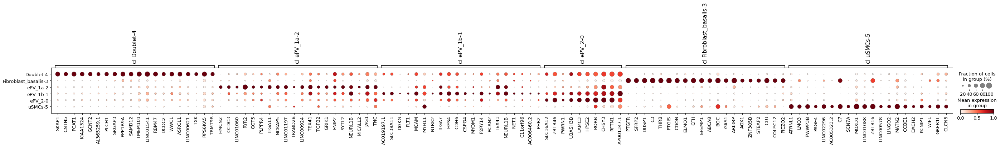

In [62]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    
sc.pl.dotplot(adata, topgenes_tfIDF, groupby='celltype_leiden', standard_scale = 'var', save='TFIDF_leiden.pdf')#topgenes_tfIDF

## By celltype

In [63]:
import anndata
adataDown = adata[[ i in ["G1"] for i in adata.obs.phase ]]
sc.pp.filter_cells(adataDown, min_genes=2000)
sc.pp.filter_genes(adataDown, min_cells=3)
adataDown = adataDown[[ i not in ['Doublet', 'LowQC', 'eS_cycling'] for i in adataDown.obs.Nuc_pv_celltype ]]
# print(adataDown.obs['leiden'].value_counts())

### Dowsample the whole dataset UN-EVEN
# adataDown = sc.pp.subsample(XX, fraction=0.25, random_state=0, copy=True) 


### Downsample to the smallest pop size
target_cells = 100

adataDown.obs['cell'] = adataDown.obs.index
adatas = [adataDown[adataDown.obs['Nuc_pv_celltype'].isin([cl])] for cl in adataDown.obs['Nuc_pv_celltype'].cat.categories]
# adatas = [adataDown[ adataDown.obs['leiden']==cl ] for cl in adataDown.obs['leiden'].cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells, random_state=0)
adata_downsampled = adatas[0].concatenate(*adatas[1:])
adataDown = adataDown[[ i in adata_downsampled.obs.cell.tolist() for i in adataDown.obs['cell'] ]]

sc.pp.filter_genes(adataDown, min_cells=10)
print(adataDown.obs['Nuc_pv_celltype'].value_counts())

del adata_downsampled
del adatas

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 58 cells that have less than 2000 genes expressed
Trying to set attribute `.obs` of view, copying.
filtered out 9100 genes that are detected in less than 3 cells
Trying to set attribute `.obs` of view, copying.
filtered out 9902 genes that are detected in less than 10 cells
Trying to set attribute `.var` of view, copying.


ePV_2                 100
ePV_1a                 89
ePV_1b                 84
Fibroblast_basalis     49
uSMCs                  41
Name: Nuc_pv_celltype, dtype: int64


In [64]:
import rpy2.rinterface_lib.callbacks
import logging
# Itoliste R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [65]:
# This is just to allow moving adata to R without errors
adataDown.X = adataDown.X.toarray()

idx = ['n_genes', 'sample',  'percent_mito', 'n_counts', 'batch', 'S_score', 'G2M_score', 'phase', 
       'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet']
for i in idx:
    del adataDown.obs[i]
    
adataDown.obs['leiden'] = adataDown.obs['leiden'].astype(str)

del adataDown.obsm['X_scVI']
del adataDown.obsm['X_umap']
del adataDown.obsp['connectivities']
del adataDown.obsp['distances']
del adataDown.uns

In [66]:
%%R -i adataDown
adataDown

class: SingleCellExperiment 
dim: 14576 363 
metadata(0):
assays(1): X
rownames(14576): A1BG A1BG-AS1 ... ZYX ZZEF1
rowData names(164): gene_ids.0 feature_types.0 ... variances
  variances_norm
colnames(363): UA_Endo12449299_CCTCACACAAACCACT
  UA_Endo11596522_CACTTCGGTAACGCGA ... UA_Endo11596521_TGCTTCGGTTAGGGTG
  UA_Endo12296824_CAAGGGAGTACCGGAA
colData names(60): library StudyName ... Group_stage cell
reducedDimNames(0):
altExpNames(0):


In [67]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$Nuc_pv_celltype


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(df_tfIDF$cluster)  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 1) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 30L)$gene)
names(topgenes_tfIDF) = unique(df_tfIDF$cluster)

In [68]:
df_tfIDF.to_csv('TFIDF_celltype.tsv', index=False, sep='\t')

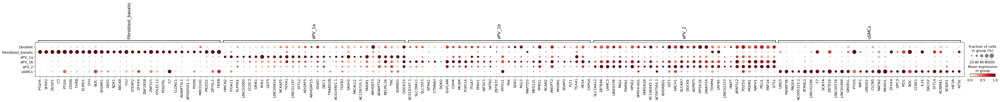

In [69]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    
sc.pl.dotplot(adata, topgenes_tfIDF, groupby='Nuc_pv_celltype', standard_scale = 'var', save='TFIDF_celltype.pdf')#topgenes_tfIDF

In [70]:
adata.write('/nfs/team292/lg18/endometriosis/clustered_objects/nuclei_PV.h5ad')

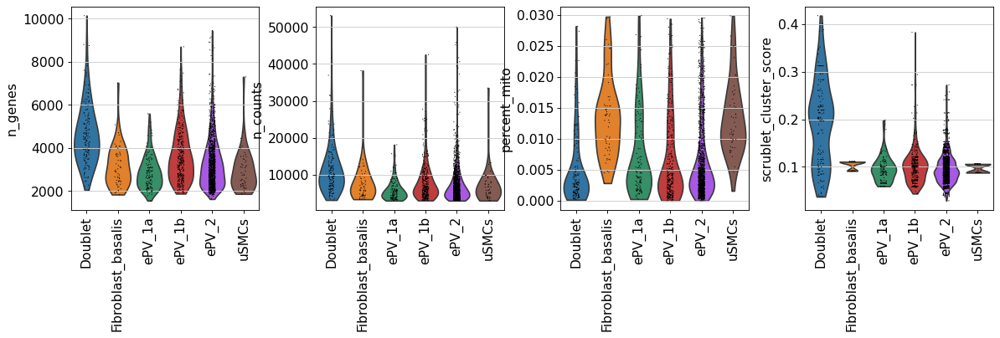

In [71]:
sc.pl.violin(adata, keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_cluster_score'], groupby = 'Nuc_pv_celltype', rotation = 90)
